<a href="https://colab.research.google.com/github/kenzeng24/food-image-recognition/blob/master/visualization.ipynb" target="_parent"><img src="https://colab.research.google.com/assets/colab-badge.svg" alt="Open In Colab"/></a>

In [1]:
import numpy as np 
import pandas as pd 
import matplotlib.pyplot as plt 
import torch
import torch.nn as nn

In [2]:
from google.colab import drive
drive.mount('/content/drive')

Drive already mounted at /content/drive; to attempt to forcibly remount, call drive.mount("/content/drive", force_remount=True).


In [3]:
!git clone https://github.com/kenzeng24/Feature-visualization.git

fatal: destination path 'Feature-visualization' already exists and is not an empty directory.


In [4]:
!pip3 install torch==1.7.1 torchvision==0.8.2 

In [5]:
import sys
from os.path import dirname
sys.path.append("Feature-visualization")


In [7]:
from optvis import visualize_feature

# load and put models in cuda mode 
models = {}

models["r152"] = torch.load('/content/drive/My Drive/resnet152_train4.pth')
models["r101"] = torch.load('/content/drive/My Drive/resnet101_2epochs.pth')
models["v11"] = torch.load('/content/drive/My Drive/vgg11_2epochs_1.pth')

for name in models:
  models[name] = models[name].eval().cuda()


/usr/local/lib/python3.7/dist-packages/torch/serialization.py:658: SourceChangeWarning: source code of class 'torch.nn.modules.conv.Conv2d' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.7/dist-packages/torch/serialization.py:658: SourceChangeWarning: source code of class 'torch.nn.modules.batchnorm.BatchNorm2d' has changed. you can retrieve the original source code by accessing the object's source attribute or set `torch.nn.Module.dump_patches = True` and use the patch tool to revert the changes.
  warnings.warn(msg, SourceChangeWarning)
/usr/local/lib/python3.7/dist-packages/torch/serialization.py:658: SourceChangeWarning: source code of class 'torch.nn.modules.activation.ReLU' has changed. you can retrieve the original source code by accessing the object's source attribute or set

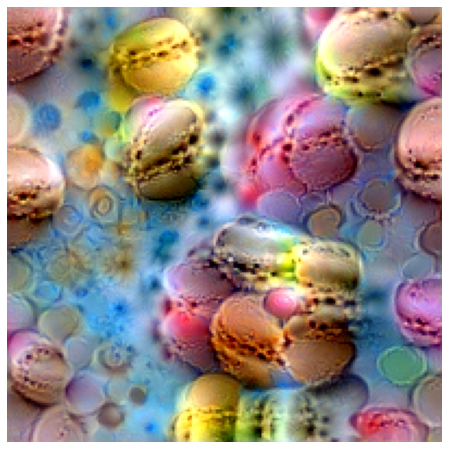

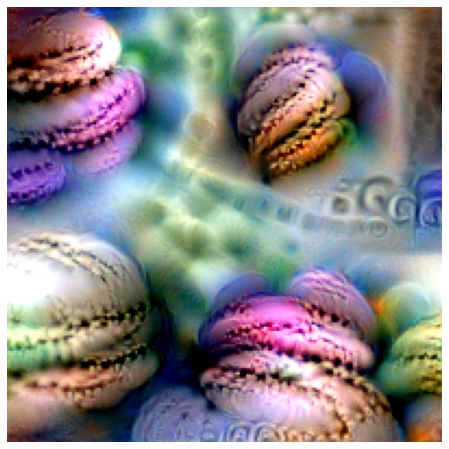

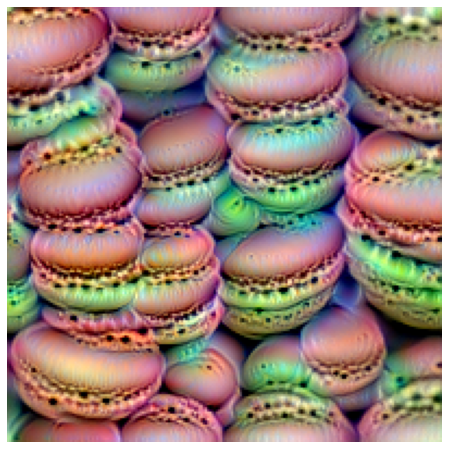

In [12]:
# visualize feature 0 for each of the models 

def visualize(name, feature):
  m = models[name]
  if name[0] == "r": visualize_feature(m, m.fc, feature)
  else: visualize_feature(m, m.classifier[6], feature)

for name in models:
    visualize(name, 0)

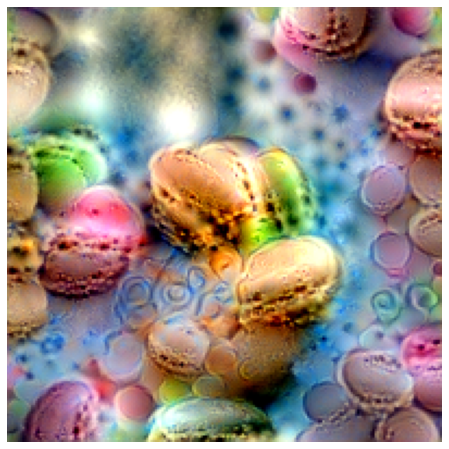

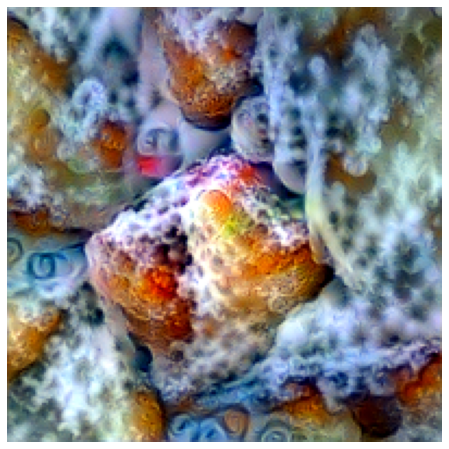

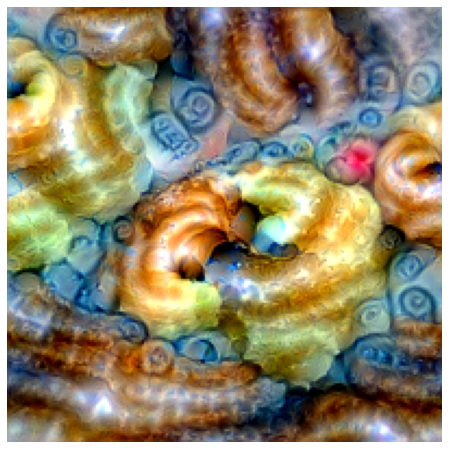

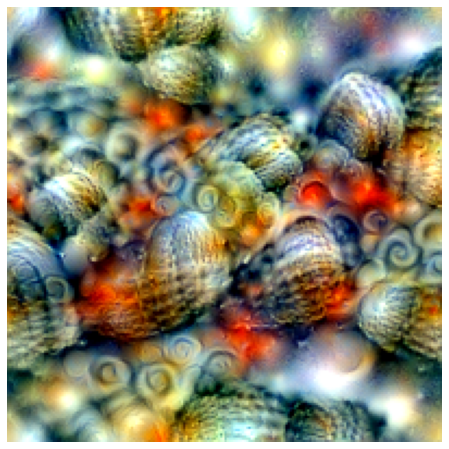

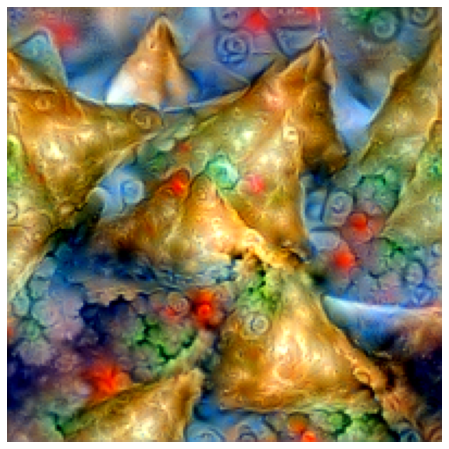

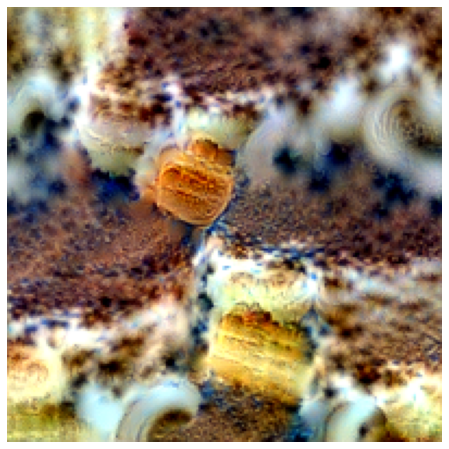

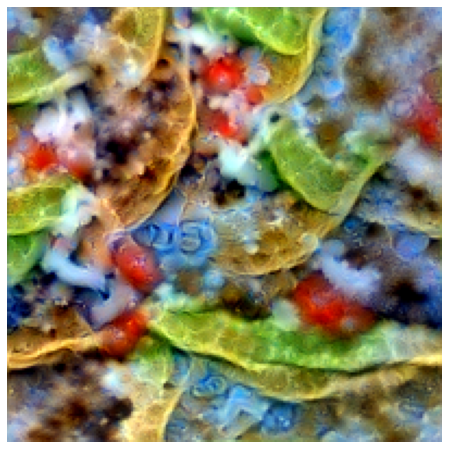

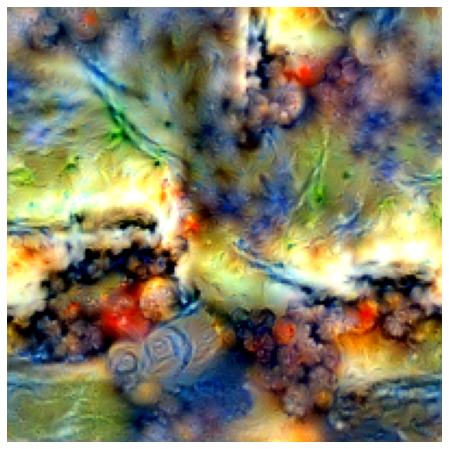

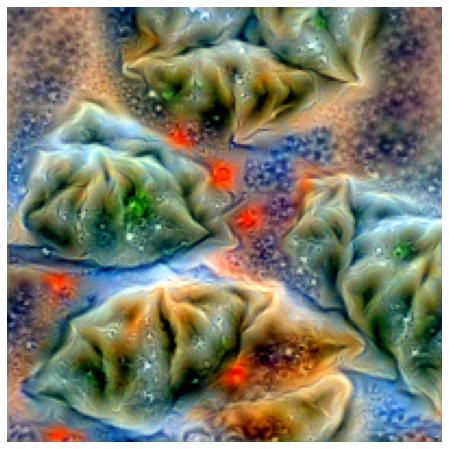

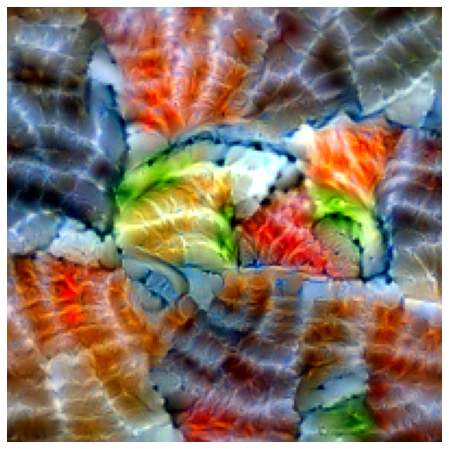

In [14]:
# iterate through the first 10 features of each residual network 

name = "r152"
for feature in range(10):
    visualize(name, feature)

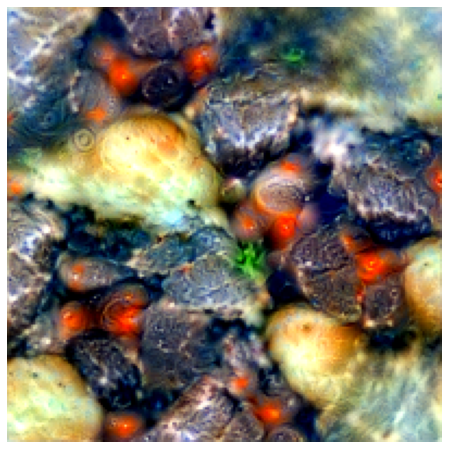

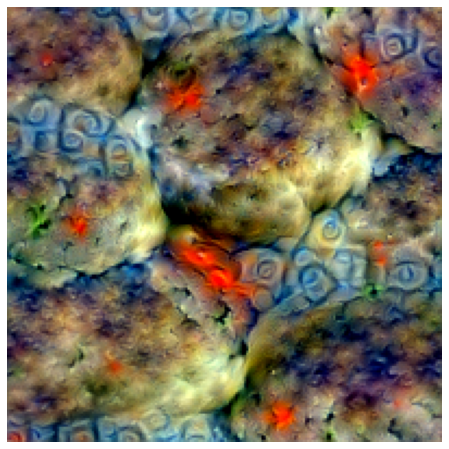

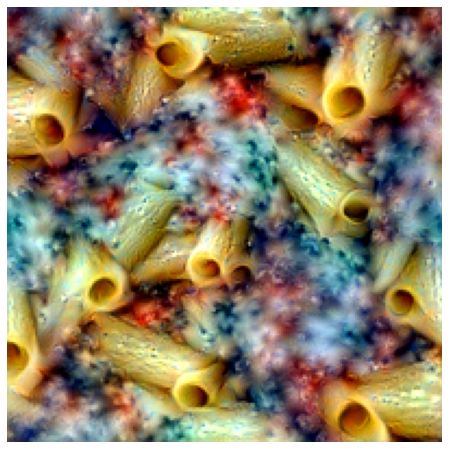

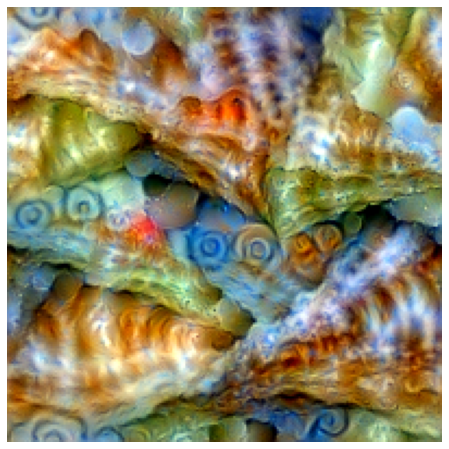

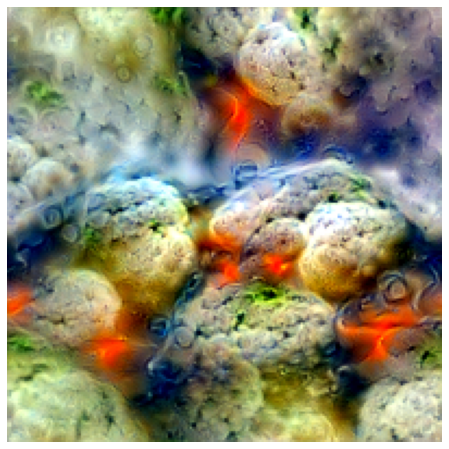

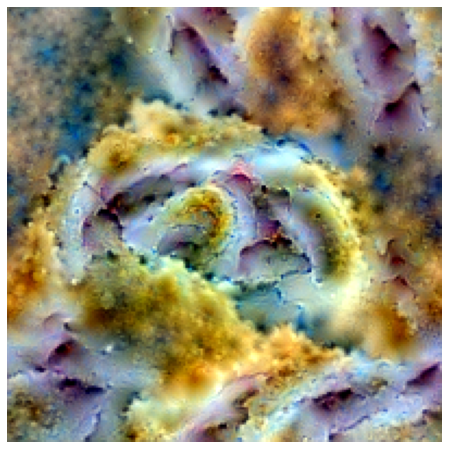

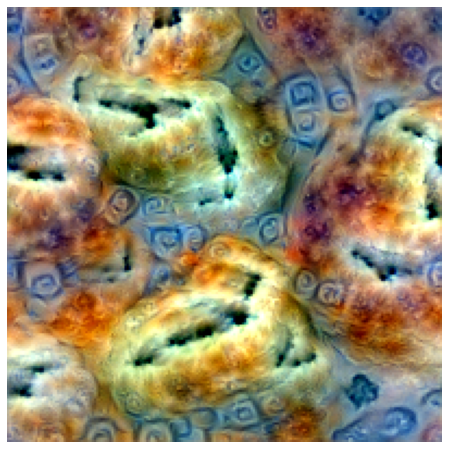

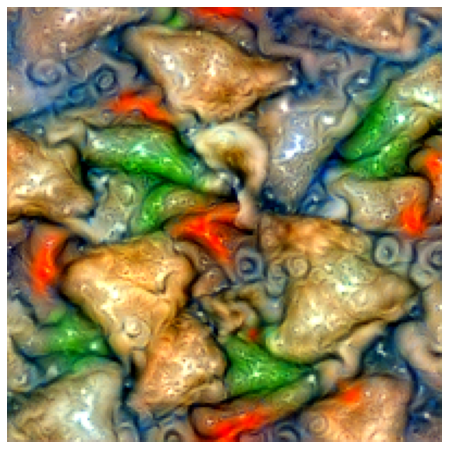

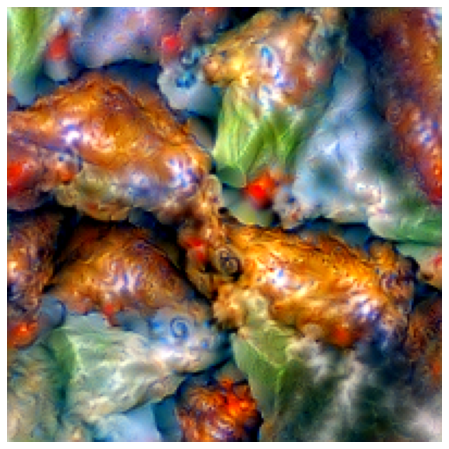

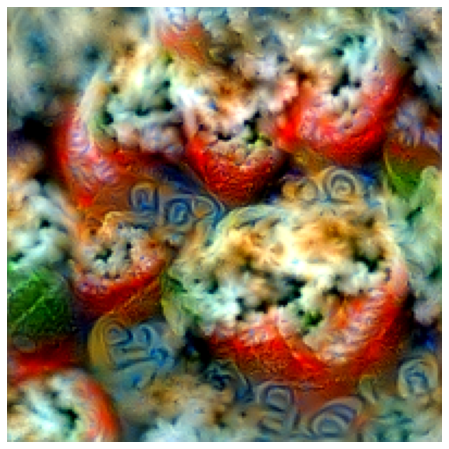

In [15]:
# check the last ten features 
name = "r152"
for feature in range(-10,0):
    visualize(name, feature)